<a href="https://www.kaggle.com/code/abdalrhamnhebishy/houae-medv-predicting?scriptVersionId=211645592" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
from IPython.core.display import HTML
# Apply styles globally within the notebook
HTML('''
<style>
  h2 {
    font-size: var(--j3p-content-font-size4);
    background-color:#D2691E  ;
    color: white;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

 img {       /* flex-grow: 1; */
            /* flex-shrink: 1; */
            border-radius: 100px 70px 150px 70px;
            border: 10px solid #eee;
            display: flex;
            align-items: center;
            justify-content: center;
            transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
        }

       img:active {
          box-shadow: 0 10px 20px rgba(255, 255, 0, 0.5), 0 6px 6px rgba(215, 215, 0, 0.5);
        }
</style>
''')        

##  Boston Housing Prediction :

<img src="https://media.istockphoto.com/id/1066106810/photo/house-real-estate-graph-price-investment-mortgage.jpg?s=2048x2048&w=is&k=20&c=xC1Pb7SchKFU9IqydCxYnRw9ypOmnJX8QEnnp5bzySU=" alt="My Image">

## Table of Contents 

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: blue; border-radius: 30px 45px 30px 45px;">

   
    
<p> &bull;      <a target="_blank"> Explantory Data Analysis</a>  </p>

<p>&bull;       <a target="_blank"> Data Processing</a>  </p>

<p>&bull;       <a target="_blank"> Visualization </a>  </p>

<p>&bull;       <a target="_blank"> Model Bulding</a> </p>   
    
<p>&bull;       <a target="_blank"> Evalution Metrics </a> </p>   

</div>

## Data Information

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: blue; border-radius: 30px 45px 30px 45px;">

<p> &bull; The Boston Housing Dataset : </p> 

<p> &bull; The Boston Housing Dataset is a derived from information collected by the U.S. Census Service concerning housing in the area of Boston MA. </p>

</div>

## Dataset Features

| Variable | Description                                                                                                |
|----------|------------------------------------------------------------------------------------------------------------|
| CRIM     | per capita crime rate by town                                                                             |
| ZN       | proportion of residential land zoned for lots over 25,000 sq.ft.                                         |
| INDUS    | proportion of non-retail business acres per town.                                                         |
| CHAS     | Charles River dummy variable (1 if tract bounds river; 0 otherwise)                                       |
| NOX      | nitric oxides concentration (parts per 10 million)                                                       |
| RM       | average number of rooms per dwelling                                                                      |
| AGE      | proportion of owner-occupied units built prior to 1940                                                   |
| DIS      | weighted distances to five Boston employment centres                                                      |
| RAD      | index of accessibility to radial highways                                                                  |
| TAX      | full-value property-tax rate per \$10,000                                                                  |
| PTRATIO  | pupil-teacher ratio by town                                                                                |
| B        | proportion of blacks by town                                                                                |
| LSTAT    | lower status of the population                                                                              |
| MEDV     | Median value of owner-occupied homes in \$1000 (Target)                                                  |

## Summary :








<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: red; border-radius: 30px 45px 30px 45px;">

<p> &bull; This problem Consider as Regression  .</p> 

<p> &bull; Target of this problem to predict in the medv  .</p> 

<p> &bull; I will Train Linear  model for Machine learning with visualization of it.  .</p> 



<p>&bull; Also i will learn the Relations between the Feature to  Make Different Plots that Represent the Data  </p>   
    
</div>

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from plotly.graph_objs import *
import plotly.express as px 
import sqlite3
from sklearn.datasets import make_regression
from sklearn.pipeline import Pipeline

In [3]:
data=pd.read_csv("boston.csv")
data.head(15)

,ID,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,2,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,4,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
3,5,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
4,7,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,395.60,12.43,22.9
5,11,0.22489,12.5,7.87,0,0.524,6.377,94.3,6.3467,5,311,15.2,392.52,20.45,15.0
6,12,0.11747,12.5,7.87,0,0.524,6.009,82.9,6.2267,5,311,15.2,396.90,13.27,18.9
7,13,0.09378,12.5,7.87,0,0.524,5.889,39.0,5.4509,5,311,15.2,390.50,15.71,21.7
8,14,0.62976,0.0,8.14,0,0.538,5.949,61.8,4.7075,4,307,21.0,396.90,8.26,20.4
9,15,0.63796,0.0,8.14,0,0.538,6.096,84.5,4.4619,4,307,21.0,380.02,10.26,18.2


## Explore the Data  :

In [4]:
#get info about the dataset:
print(data.info())
print("-"*25)
# to know more about the shape of the dataset:
print("shape of the dataset -->>",np.shape(data))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333 entries, 0 to 332
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ID       333 non-null    int64  
 1   crim     333 non-null    float64
 2   zn       333 non-null    float64
 3   indus    333 non-null    float64
 4   chas     333 non-null    int64  
 5   nox      333 non-null    float64
 6   rm       333 non-null    float64
 7   age      333 non-null    float64
 8   dis      333 non-null    float64
 9   rad      333 non-null    int64  
 10  tax      333 non-null    int64  
 11  ptratio  333 non-null    float64
 12  black    333 non-null    float64
 13  lstat    333 non-null    float64
 14  medv     333 non-null    float64
dtypes: float64(11), int64(4)
memory usage: 39.1 KB
None
-------------------------
shape of the dataset -->> (333, 15)


In [5]:
#get the statistical:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,333.0,250.951952,147.859438,1.00000,123.00000,244.00000,377.00000,506.0000
crim,333.0,3.360341,7.352272,0.00632,0.07896,0.26169,3.67822,73.5341
zn,333.0,10.689189,22.674762,0.00000,0.00000,0.00000,12.50000,100.0000
indus,333.0,11.293483,6.998123,0.74000,5.13000,9.90000,18.10000,27.7400
chas,333.0,0.060060,0.237956,0.00000,0.00000,0.00000,0.00000,1.0000
nox,333.0,0.557144,0.114955,0.38500,0.45300,0.53800,0.63100,0.8710
rm,333.0,6.265619,0.703952,3.56100,5.88400,6.20200,6.59500,8.7250
age,333.0,68.226426,28.133344,6.00000,45.40000,76.70000,93.80000,100.0000
dis,333.0,3.709934,1.981123,1.12960,2.12240,3.09230,5.11670,10.7103
rad,333.0,9.633634,8.742174,1.00000,4.00000,5.00000,24.00000,24.0000


In [6]:
# get Types of data:

data.dtypes

ID           int64
crim       float64
zn         float64
indus      float64
chas         int64
nox        float64
rm         float64
age        float64
dis        float64
rad          int64
tax          int64
ptratio    float64
black      float64
lstat      float64
medv       float64
dtype: object

In [7]:
# know the number of every item in every column:

for col in data.columns:
    print(f"counts of items in {col} -->> \n {data[col].value_counts()}")
    print("-"*25)

counts of items in ID -->> 
 ID
1      1
345    1
343    1
342    1
341    1
      ..
164    1
162    1
161    1
160    1
506    1
Name: count, Length: 333, dtype: int64
-------------------------
counts of items in crim -->> 
 crim
0.01501    2
0.00632    1
0.04544    1
0.01301    1
0.06151    1
          ..
1.46336    1
1.27346    1
1.42502    1
1.34284    1
0.04741    1
Name: count, Length: 332, dtype: int64
-------------------------
counts of items in zn -->> 
 zn
0.0      248
20.0      14
80.0       7
25.0       7
22.0       7
12.5       6
45.0       5
33.0       3
34.0       3
55.0       3
90.0       3
60.0       3
95.0       3
30.0       3
21.0       3
75.0       3
85.0       2
28.0       2
40.0       2
52.5       1
18.0       1
82.5       1
17.5       1
100.0      1
35.0       1
Name: count, dtype: int64
-------------------------
counts of items in indus -->> 
 indus
18.10    88
19.58    21
6.20     14
8.14     13
21.89    10
         ..
6.41      1
1.21      1
2.97      1
2.25 

In [8]:
# to know the uniques values in evey column in the dataset:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  :  \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>ID column  :  
[  1   2   4   5   7  11  12  13  14  15  16  17  19  21  22  23  24  28
  31  32  35  39  40  41  43  44  45  46  47  48  50  51  52  54  55  56
  57  58  59  61  62  64  65  66  67  68  69  71  73  74  75  76  77  78
  81  82  84  85  86  87  88  89  90  91  94  95  97 101 102 103 104 107
 108 109 110 112 115 117 118 119 120 121 122 123 124 125 127 128 129 132
 134 135 137 138 139 140 142 143 146 148 149 150 151 154 155 157 159 160
 161 162 164 165 166 167 168 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 187 188 190 191 192 193 194 195 198 201 202 204 205 206
 207 209 212 214 215 217 222 223 224 225 226 227 228 230 231 233 234 235
 236 237 241 243 244 245 247 249 250 251 252 254 261 262 263 264 265 266
 267 269 272 273 274 275 280 282 283 284 285 286 287 289 291 293 294 297
 298 302 303 304 305 306 307 309 310 311 312 313 316 317 318 319 321 325
 326 328 329 331 334 335 337 339 340 341 342 343 344 345 348 349 350 353
 357 358 359

In [9]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns

    num_cols=data.select_dtypes("number").columns

    disc_cols=data.select_dtypes(include=("int64")).columns

    conts_cols=data.select_dtypes(include=("float64")).columns

    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index([], dtype='object')
 Numerical_columns ----->>> Index(['ID', 'crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis', 'rad',
       'tax', 'ptratio', 'black', 'lstat', 'medv'],
      dtype='object') 
 Discrete_columns ---->>> Index(['ID', 'chas', 'rad', 'tax'], dtype='object') 
 Continous_cols ----->> Index(['crim', 'zn', 'indus', 'nox', 'rm', 'age', 'dis', 'ptratio', 'black',
       'lstat', 'medv'],
      dtype='object') 
 Nominal Columns --->> chas    2
dtype: int64




## Cleaning :




<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: blue; border-radius: 30px 45px 30px 45px;">

<p> &bull; i will check i found any missing values or not  .</p> 

<p> &bull; if found any small missisng values i will use dropna to get ride from it .</p> 

<p> &bull; I used the Simple Imputer Method to fill the Null Values  with large number of missing values.</p> 

<p> &bull; I used mean/median Strategy with Numerical Features  .</p> 

<p> &bull;I used most_frequence with Categorical Features if found  .</p> 

<p> &bull; I make Reshape , then i make squeeze on it  . </p>

<p> &bull; I will use fillna method if i needed  . </p>

<p> &bull; ok data is cleaned  . </p>
</div>



In [10]:
data.isna().mean()

ID         0.0
crim       0.0
zn         0.0
indus      0.0
chas       0.0
nox        0.0
rm         0.0
age        0.0
dis        0.0
rad        0.0
tax        0.0
ptratio    0.0
black      0.0
lstat      0.0
medv       0.0
dtype: float64

In [11]:
# Check if there are aduplicated values in the data & drop it if found :
df=data
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)
df = df.drop_duplicates()
duplicated_features=df.duplicated().sum()
print("Number of duplicates of cleaning it ----->>> ",duplicated_features)

Number of duplicates ----->>>  0
Number of duplicates of cleaning it ----->>>  0


## SQL Analysis :

In [12]:
# Connect to the database
conn = sqlite3.connect('Houses_price.db')

# Create a cursor object
cursor = conn.cursor()

# Check if the table 'insurance1' exists
cursor.execute("""
SELECT * FROM sqlite_master WHERE type='table' AND name='HB';
""")
table_exists = cursor.fetchone()

# Create the table only if it does not exist
if not table_exists:
    # Assuming 'data' is your pandas DataFrame
    data.to_sql("HB", conn, if_exists='fail')  # 'fail' will raise a ValueError if the table already exists
else:
    print("The table 'HB' already exists. Skipping table creation.")

The table 'HB' already exists. Skipping table creation.


In [13]:
df = pd.read_sql("SELECT * FROM HB", conn)
df.drop(columns="index",axis=1)

,ID,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,2,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,4,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
3,5,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
4,7,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,395.60,12.43,22.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328,500,0.17783,0.0,9.69,0,0.585,5.569,73.5,2.3999,6,391,19.2,395.77,15.10,17.5
329,502,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
330,503,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
331,504,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9


## SQL Queries :














<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; I make some Queries to Deep more in the Data to Answer on the Client Questions. </p> 

<p> &bull; Also i used it As There Some Complex Questions that i cant Answer it using Pandas  .</p> 

<p> &bull; Finally , I used it As it Extract Answers from the Relational Questions   .</p> 


</div>

In [14]:
# Q1: whats average of price houses  & average of houses in the town that crime rate bigger than  60 %  & AGE?   :

print("===whats average of price houses in the town that crime rate bigger than  60 % === ")
R1=cursor.execute("SELECT round(AVG(MEDV)),round(AVG(AGE)) FROM HB WHERE crim >0.6  ")
print(R1.fetchall())
print("-"*50)

# Q2: how much of tax for houses with Age bigger than 60 years and ZN >12 ?

print("===  Tax for houses that Age bigger than 60 years and ZN bigger than 12  === ")
R2=cursor.execute("SELECT round(AVG(tax)) FROM HB  WHERE AGE >60 AND ZN>12   ")
print(R2.fetchall())
print("-"*50)

#Q3: whats  minimum  LSTAT , sum  of  Room  


R3=cursor.execute("""
SELECT LSTAT,SUM(RM)
FROM HB 
""")
print("=== minimum  LSTAT , sum  of  Room  === \n ",R3.fetchall())


===whats average of price houses in the town that crime rate bigger than  60 % === 
[(19.0, 88.0)]
--------------------------------------------------
===  Tax for houses that Age bigger than 60 years and ZN bigger than 12  === 
[(277.0,)]
--------------------------------------------------
=== minimum  LSTAT , sum  of  Room  === 
  [(4.98, 2086.450999999999)]


In [15]:
# Calculate the correlation :

corr=data.select_dtypes("number").corr()
corr

,ID,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
ID,1.000000,0.456312,-0.155639,0.421978,0.007958,0.440185,-0.112790,0.257300,-0.356461,0.707526,0.686246,0.309838,-0.271619,0.281953,-0.221694
crim,0.456312,1.000000,-0.210913,0.422228,-0.041195,0.463001,-0.310180,0.379034,-0.397067,0.666636,0.617081,0.313409,-0.475796,0.532077,-0.407454
zn,-0.155639,-0.210913,1.000000,-0.518679,-0.024442,-0.501990,0.328197,-0.544513,0.637142,-0.303663,-0.311180,-0.380449,0.168130,-0.388112,0.344842
indus,0.421978,0.422228,-0.518679,1.000000,0.037496,0.750087,-0.440365,0.638378,-0.702327,0.569779,0.708313,0.391087,-0.335049,0.614155,-0.473932
chas,0.007958,-0.041195,-0.024442,0.037496,1.000000,0.080275,0.112251,0.068286,-0.081834,0.007714,-0.021826,-0.125067,0.062029,-0.050055,0.204390
nox,0.440185,0.463001,-0.501990,0.750087,0.080275,1.000000,-0.338515,0.736000,-0.769364,0.612180,0.670722,0.192513,-0.369416,0.598874,-0.413054
rm,-0.112790,-0.310180,0.328197,-0.440365,0.112251,-0.338515,1.000000,-0.248573,0.269191,-0.272783,-0.356987,-0.366927,0.155202,-0.615747,0.689598
age,0.257300,0.379034,-0.544513,0.638378,0.068286,0.736000,-0.248573,1.000000,-0.764208,0.447380,0.511893,0.259293,-0.268054,0.588834,-0.358888
dis,-0.356461,-0.397067,0.637142,-0.702327,-0.081834,-0.769364,0.269191,-0.764208,1.000000,-0.477610,-0.529539,-0.231101,0.284374,-0.505939,0.249422
rad,0.707526,0.666636,-0.303663,0.569779,0.007714,0.612180,-0.272783,0.447380,-0.477610,1.000000,0.903562,0.470849,-0.406405,0.484568,-0.352251


Text(0.5, 1.0, 'Correlation_heatmap_Matrix')

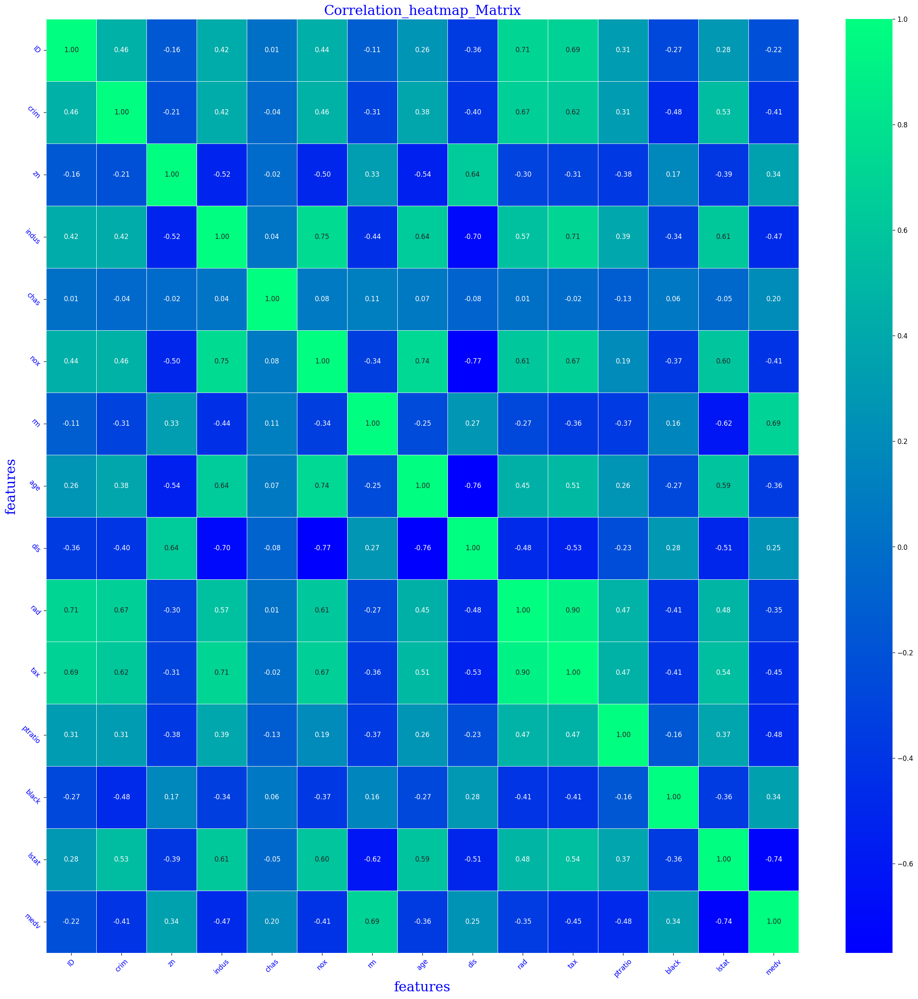

In [16]:
# plot the heatmap:
# plot the heatmap_Correlation_MatRix:
f1={"family":"serif","size":20,"color":"b"}
plt.figure(figsize=(25,25),dpi=120)
sns.heatmap(data.select_dtypes("number").corr(),annot=True,fmt="0.2f",cmap='winter',linewidths=0.5)
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.xlabel("features",fontdict=f1)
plt.ylabel("features",fontdict=f1)
plt.title("Correlation_heatmap_Matrix",fontdict=f1)

## Defination Outliers & cleaning the data from outliers  :

In [17]:
# found many feature contain the outliers  :
features=data.select_dtypes(include="number").columns

for col in features:
    Q1_col,Q3_col=data[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in data[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)} ")
    print("-"*25)
    

 * -- >> there No outlier in ID feature
Q1 of ID --->>> 123.0 
 Q3 of ID ---->>> 377.0 
 iqr--->>254.0
 low_limit--->>>-258.0 
  upper_limit--->>> 758.0 
 outlier---->>> [] 
 Number of outliers --->>> 0 
-------------------------
Ther outlier in this feature crim
Q1 of crim --->>> 0.07896 
 Q3 of crim ---->>> 3.67822 
 iqr--->>3.59926
 low_limit--->>>-5.319929999999999 
  upper_limit--->>> 9.07711 
 outlier---->>> [13.5222, 9.2323, 11.1081, 18.4982, 15.288, 9.82349, 9.18702, 20.0849, 24.3938, 22.5971, 11.5779, 13.3598, 38.3518, 25.0461, 14.2362, 24.8017, 11.9511, 28.6558, 45.7461, 18.0846, 25.9406, 73.5341, 11.8123, 15.8603, 37.6619, 9.33889, 10.0623, 13.9134, 15.1772, 9.39063, 22.0511, 9.72418, 9.96654, 12.8023, 10.6718, 9.92485, 9.32909, 15.5757, 13.0751, 15.0234, 10.233, 14.3337] 
 Number of outliers --->>> 42 
-------------------------
Ther outlier in this feature zn
Q1 of zn --->>> 0.0 
 Q3 of zn ---->>> 12.5 
 iqr--->>12.5
 low_limit--->>>-18.75 
  upper_limit--->>> 31.25 
 outli

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


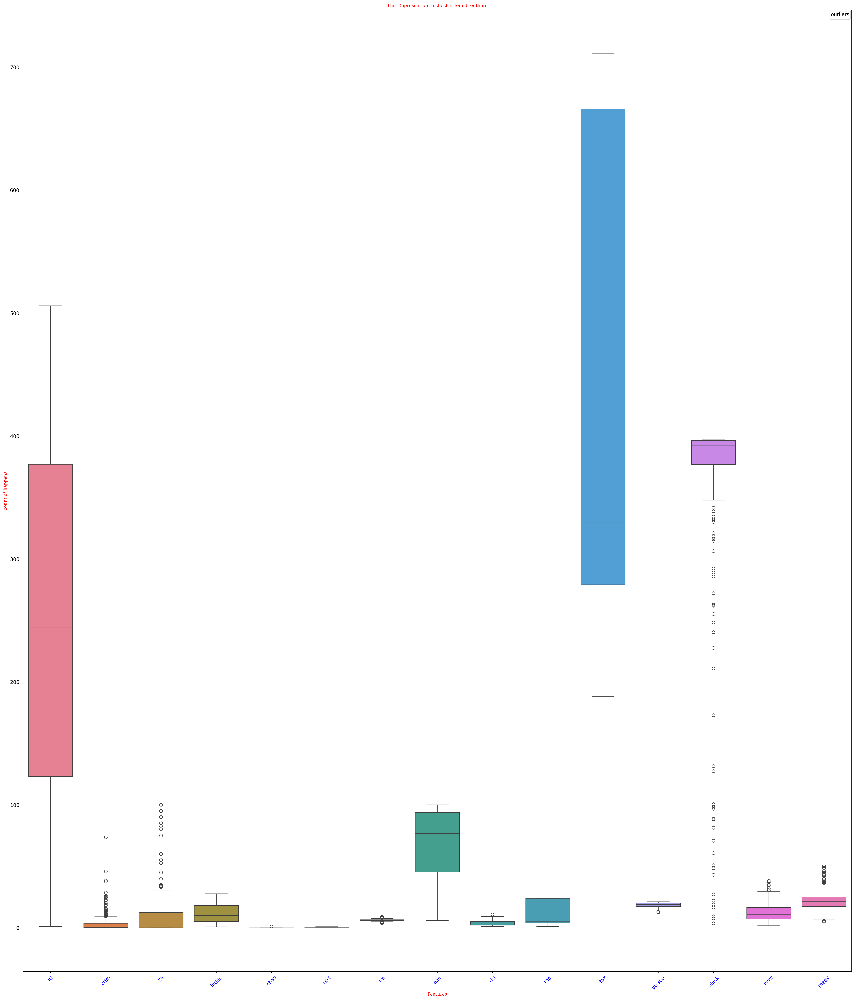

In [18]:
# from this Represention we discover that we found outliers :
f1={"family":"serif","size":9,"color":"r"}
plt.figure(figsize=(30,35),dpi=250)
plt.title("This Represention to check if found  outliers",fontdict=f1)
plt.xlabel("Features",fontdict=f1)
plt.ylabel("count of happens",fontdict=f1)
plt.xticks(rotation=45,color="b")
sns.boxplot(data[features])
plt.legend(title="outliers",prop={'size': 5})

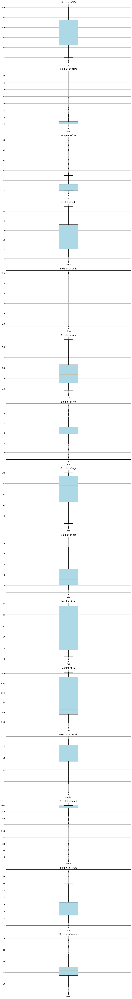

In [19]:
num_columns = len(data.columns)
plt.figure(figsize=(10, 5 * num_columns))
for i, col in enumerate(data.columns):
    plt.subplot(num_columns, 1, i + 1)
    plt.boxplot(data[col], patch_artist=True, boxprops=dict(facecolor='lightblue'))
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.grid(True)

plt.tight_layout() 
plt.show()



In [20]:
def remove_outliers_iqr(df):
    outlier_counts = {}
    for column in df.select_dtypes(include=[np.number]).columns:  
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        
        
        outlier_counts[column] = outliers.shape[0]
        
        # Remove outliers from the DataFrame
        df_cleaned_without_outlier = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    return df_cleaned_without_outlier, outlier_counts

# Remove outliers and get the count of outliers found
df_cleaned, outlier_counts = remove_outliers_iqr(data)

# Display the results
print("Number of outliers detected in each column:")
print(outlier_counts)
print("-"*70)
print("\nDataFrame after removing outliers:")
print(df_cleaned)

Number of outliers detected in each column:
{'ID': 0, 'crim': 42, 'zn': 41, 'indus': 0, 'chas': 20, 'nox': 0, 'rm': 21, 'age': 0, 'dis': 1, 'rad': 0, 'tax': 0, 'ptratio': 9, 'black': 47, 'lstat': 7, 'medv': 28}
----------------------------------------------------------------------

DataFrame after removing outliers:
      ID     crim    zn  indus  chas    nox     rm   age     dis  rad  tax  \
0      1  0.00632  18.0   2.31     0  0.538  6.575  65.2  4.0900    1  296   
1      2  0.02731   0.0   7.07     0  0.469  6.421  78.9  4.9671    2  242   
2      4  0.03237   0.0   2.18     0  0.458  6.998  45.8  6.0622    3  222   
3      5  0.06905   0.0   2.18     0  0.458  7.147  54.2  6.0622    3  222   
4      7  0.08829  12.5   7.87     0  0.524  6.012  66.6  5.5605    5  311   
..   ...      ...   ...    ...   ...    ...    ...   ...     ...  ...  ...   
328  500  0.17783   0.0   9.69     0  0.585  5.569  73.5  2.3999    6  391   
329  502  0.06263   0.0  11.93     0  0.573  6.593  69.1  

upper_limit :  25.41715698181479
lower_limit :  -18.696474038871848
Mean Value :  3.360341471471471
Median Value :  0.26169
1st Standard Deviation :  7.352271836781107


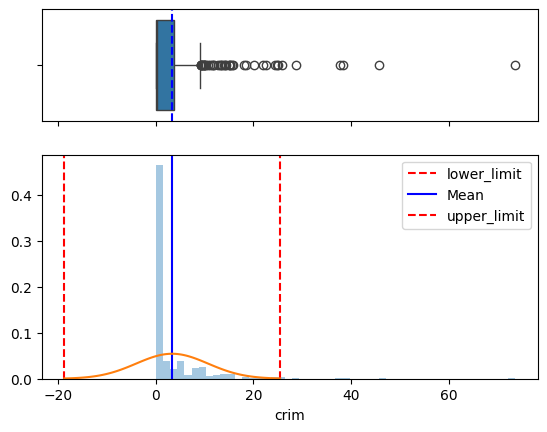

In [21]:
#calculate outlier on crim feature:-
# We can see that Distibution in this feature follow Standard Normal Distribution N -> (0,1)

from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.crim.mean()
std = data.crim.std()
median = data.crim.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["crim"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["crim"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

## Visualization :

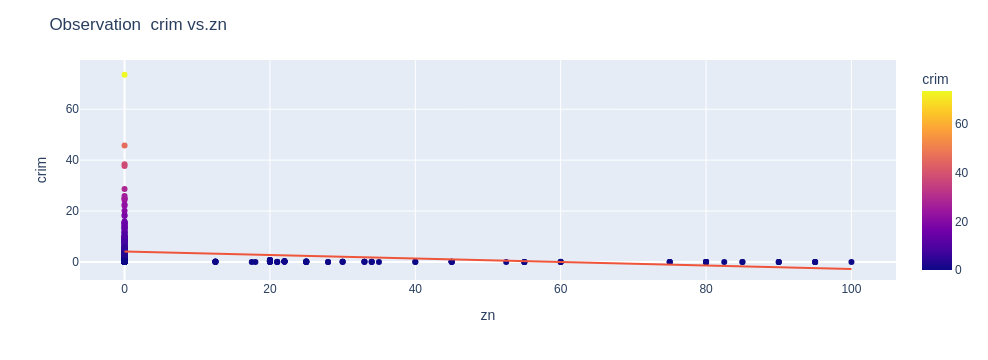

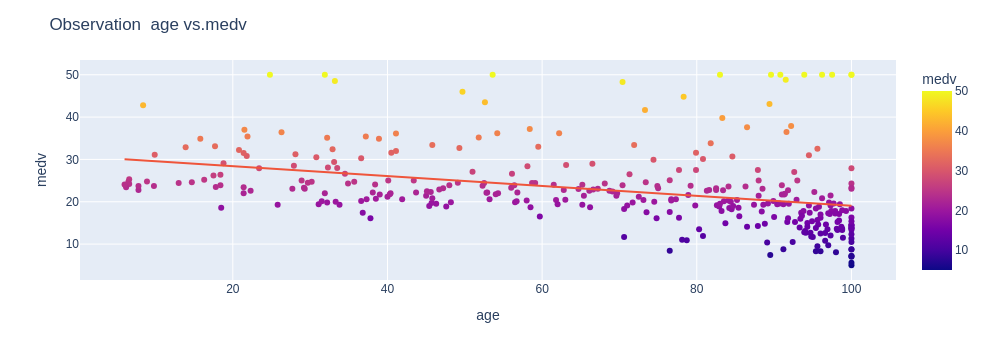

In [22]:
# Observation  crim	 vs.zn (scatterplot) Negative Relationship :
color_palette = ['#8B008B', '#1E90FF', '#FF6347', '#B22222', '#228B22', '#2F4F4F']
fig = px.scatter(data, x='zn', y='crim', color='crim', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  crim vs.zn", xaxis_title="zn", yaxis_title="crim")
fig.show()


# Observation  age vs.medv (scatterplot) Negative Relationship :

fig = px.scatter(data, x='age', y='medv', color='medv', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  age vs.medv", xaxis_title="age", yaxis_title="medv")
fig.show()


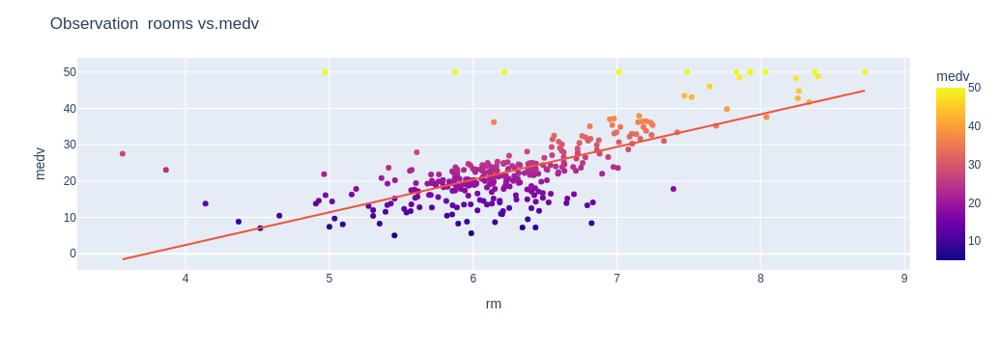

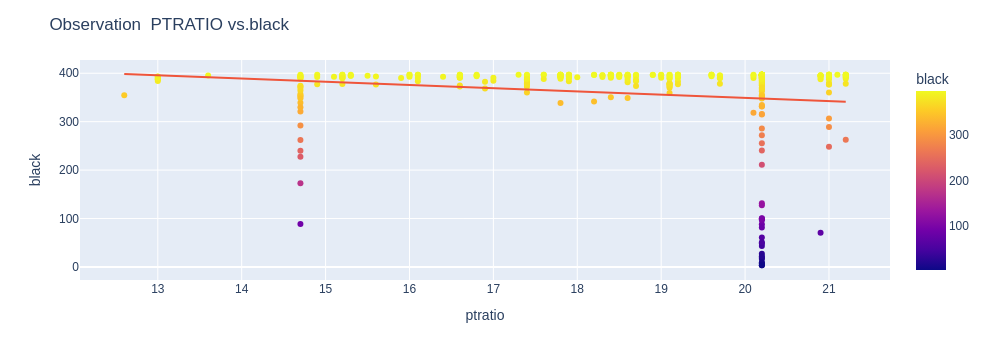

In [23]:
# Observation   rooms  vs.medv (scatterplot) positive Relationship :

fig = px.scatter(data, x='rm', y='medv', color='medv', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  rooms vs.medv", xaxis_title="rm", yaxis_title="medv")
fig.show()

# Observation  PTRATIO vs.black (scatterplot) Negative Relationship :

fig = px.scatter(data, x='ptratio', y='black', color='black', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  PTRATIO vs.black ", xaxis_title="ptratio", yaxis_title="black")
fig.show()





## Waffle Visualization :














<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i Make Waffle observation to see which feature that Controlled on other Features . </p> 

<p> &bull; i found zn (Customized allotment of 25,000 square plots.) Feature controled on other features .</p> 

<p> &bull; Finally , zn Feature : is the most important Feature in the Data   .</p> 


</div>

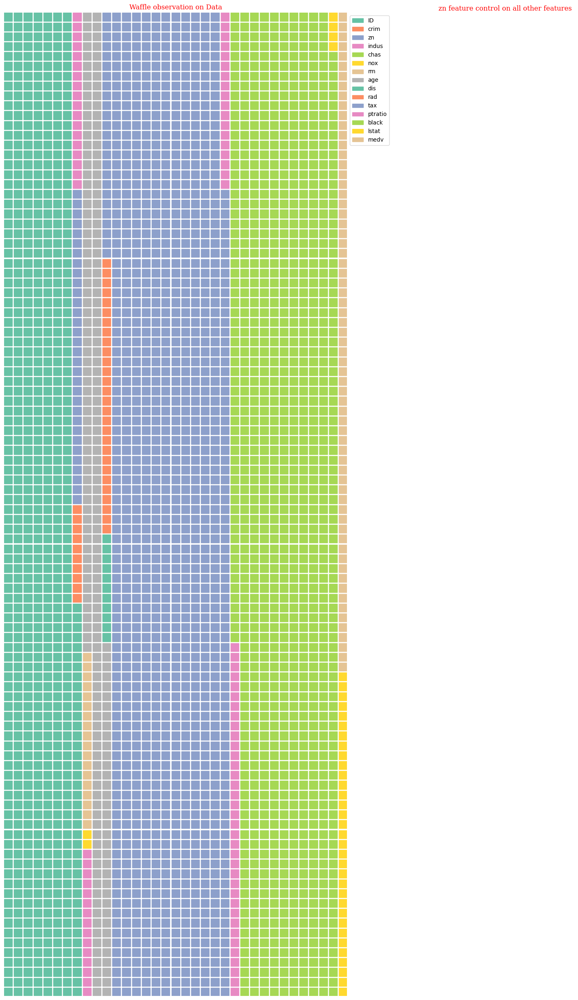

In [24]:
# Make a waffel for the Data:
# from this waffle i see which Feature is a controled on other features : 


f2 = {"family": "serif", "size": 12, "color": "r"}

from pywaffle import Waffle

numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
values = data[numeric_columns].sum().tolist()

fig = plt.figure(
    FigureClass=Waffle,
    rows=100,
    columns=35,
    values=values,
    legend={'labels': numeric_columns.tolist(),
            'loc': "upper left",
            'bbox_to_anchor': (1, 1)},
    figsize=(25, 25)
)
plt.title("Waffle observation on Data",fontdict=f2)
plt.suptitle("zn feature control on all other features ",fontdict=f2)
plt.show()

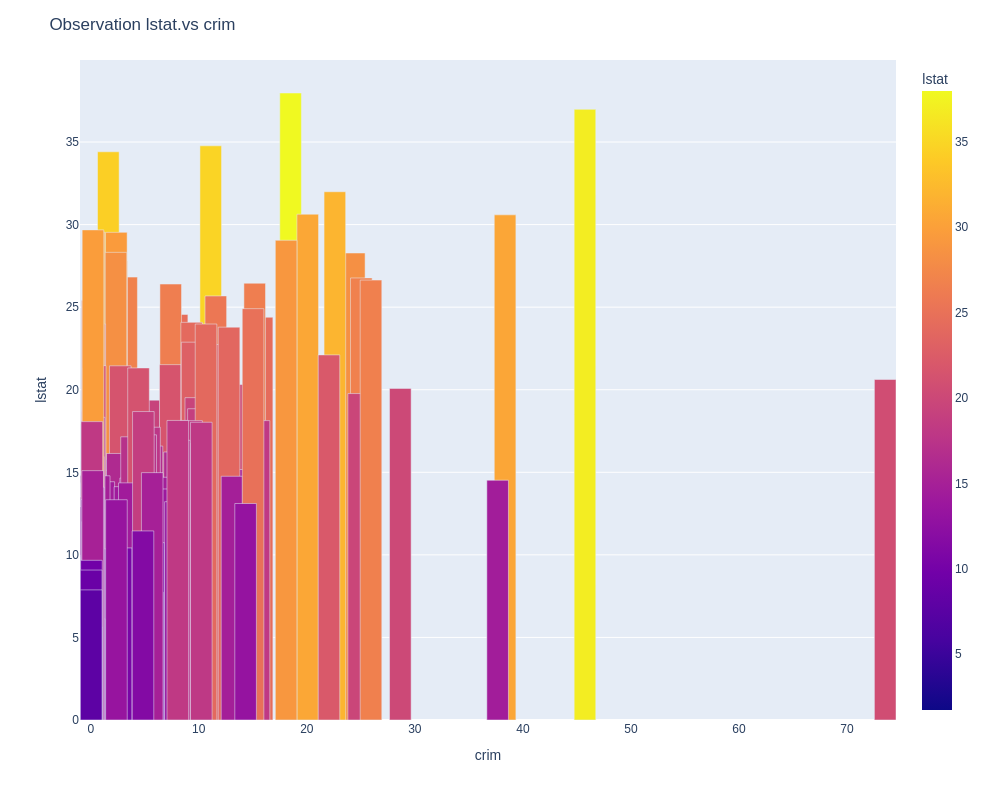

In [25]:
# zn.vs crim : 

color_palette = ['#8B008B', '#1E90FF', '#FF6347', '#B22222', '#228B22', '#2F4F4F']
fig = px.bar(data, x='crim', y='lstat', color='lstat', color_discrete_sequence=color_palette)
fig.update_layout(
       title="Observation lstat.vs crim  ", 
       
       xaxis_title="crim",
    
        yaxis_title="lstat",
        width=1200,
       height=800,
       barmode='relative')

# Update the bar width
fig.update_traces(width=2)
fig.show()


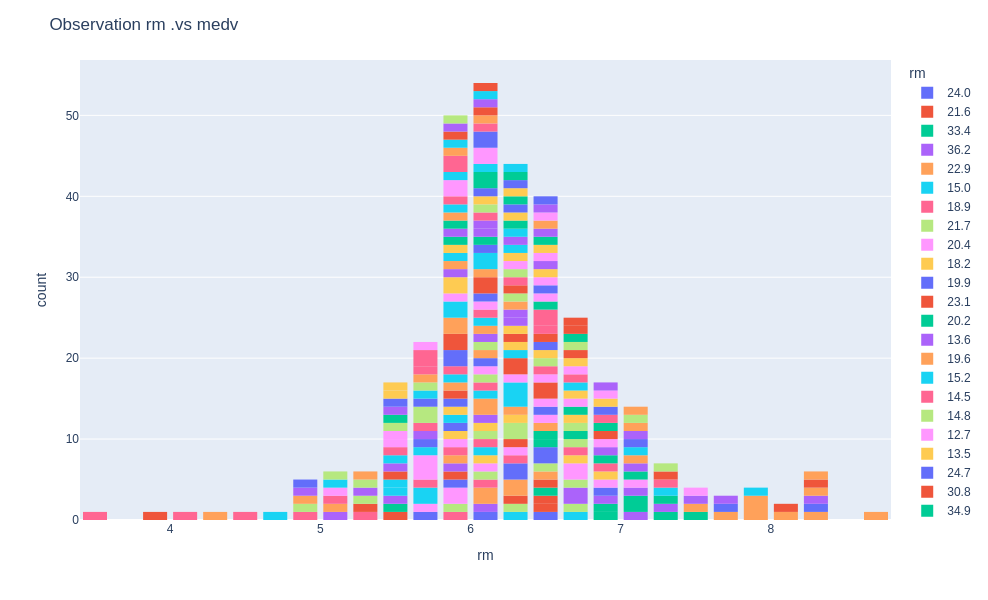

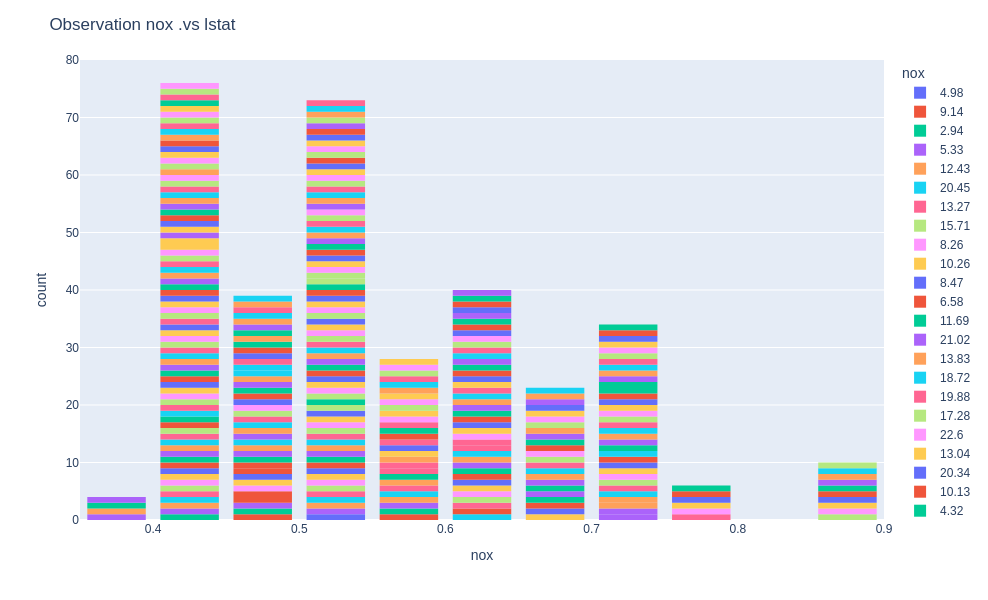

In [26]:
# Histogram that show how rm (median of rooms) feature liked with price :
fig = px.histogram(data, x="rm", color="medv")
fig.update_layout(
    bargap=0.2,
    title="Observation rm .vs medv",
    legend_title="rm",
    width=800,  
    height=600  
)
fig.show()


# Here also you can see how  nox feature liked with lstat 

fig = px.histogram(data, x="nox", color="lstat")
fig.update_layout(
    bargap=0.2,
    title="Observation nox .vs lstat",
    legend_title="nox",
    width=800,  
    height=600  
)
fig.show()


In [27]:
data.columns

Index(['ID', 'crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis', 'rad',
       'tax', 'ptratio', 'black', 'lstat', 'medv'],
      dtype='object')

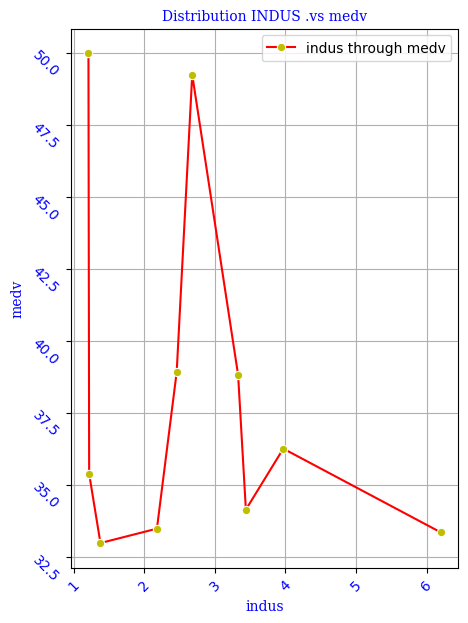

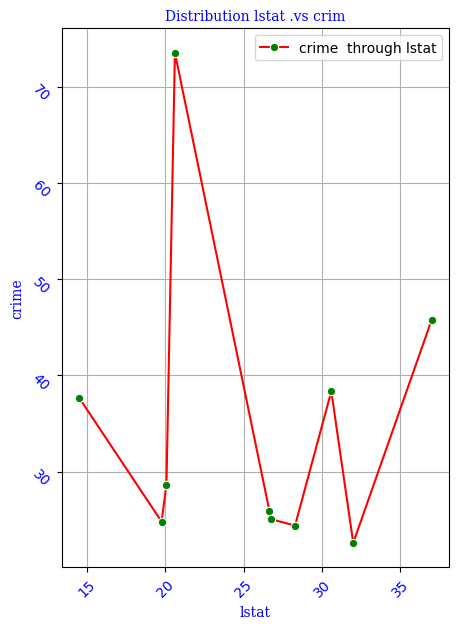

In [28]:
# observation  INDUS .vs medv

f2={"family":"serif","size":10,"color":"b"}
plt.figure(figsize=(5,7))
plt.title("Distribution INDUS .vs medv",fontdict=f2)

top1=data.groupby("indus")["medv"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="y",label="indus through medv")

plt.xticks(rotation=45,color="b")
plt.xlabel("indus",fontdict=f2)
plt.ylabel("medv",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()

# Distribution lstat .vs crim :


plt.figure(figsize=(5,7))
plt.title("Distribution lstat .vs crim",fontdict=f2)

top1=data.groupby("lstat")["crim"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="g",label="crime  through lstat")

plt.xticks(rotation=45,color="b")
plt.xlabel("lstat",fontdict=f2)
plt.ylabel("crime",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


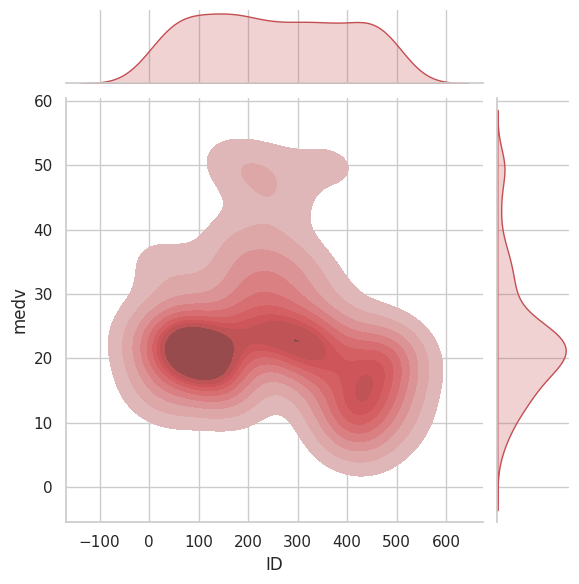

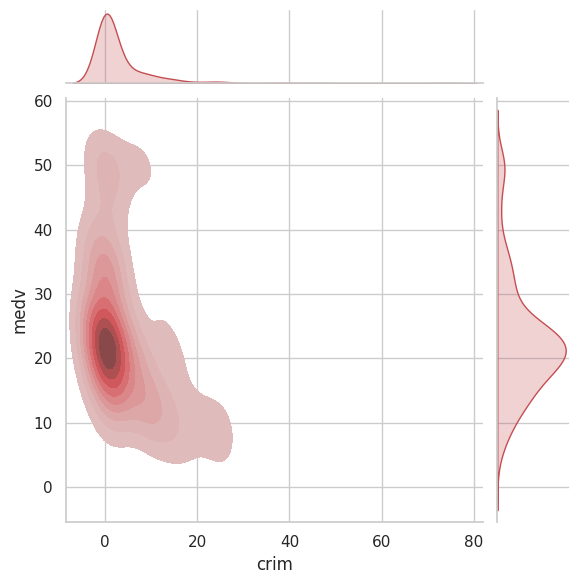

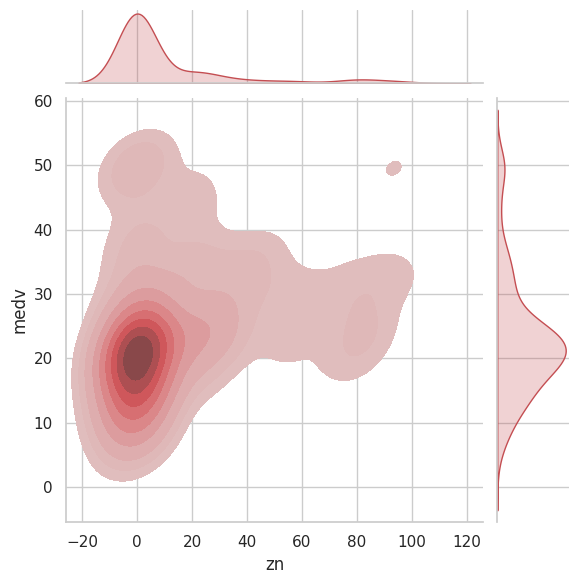

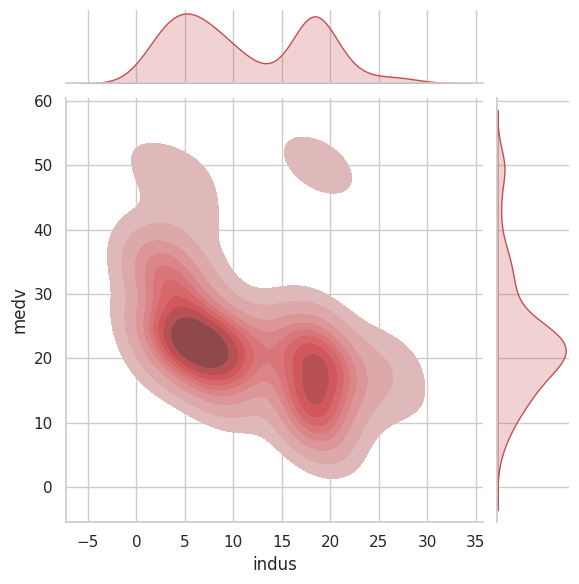

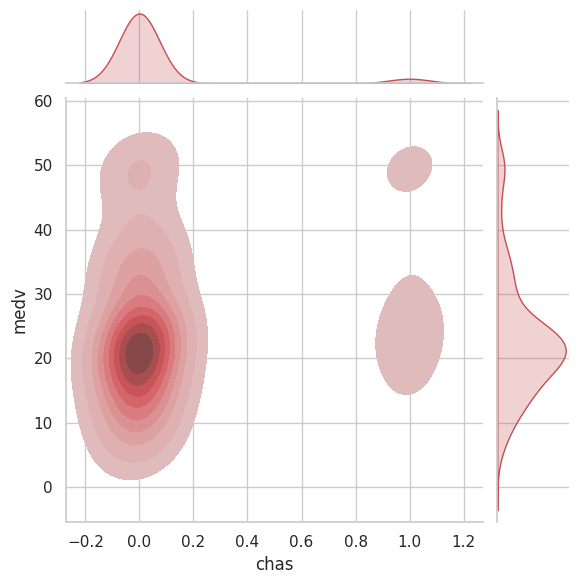

...

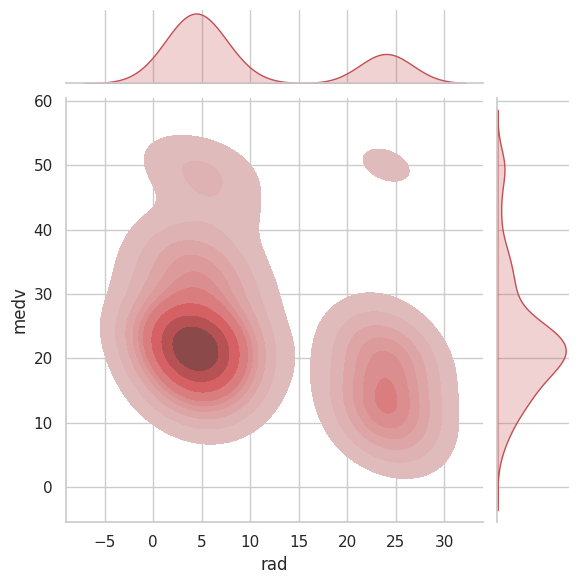

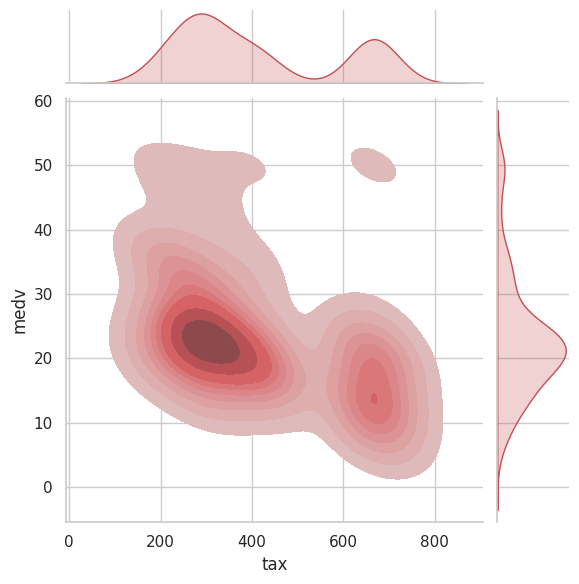

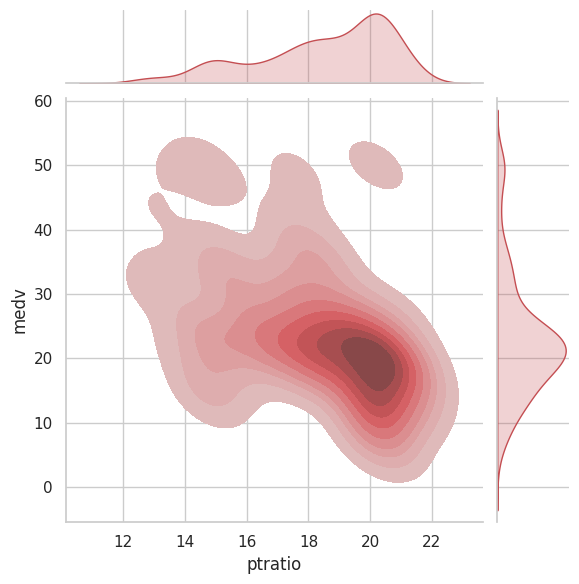

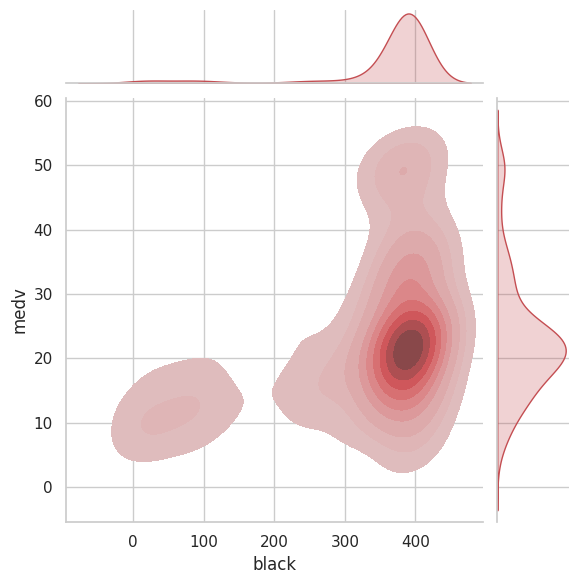

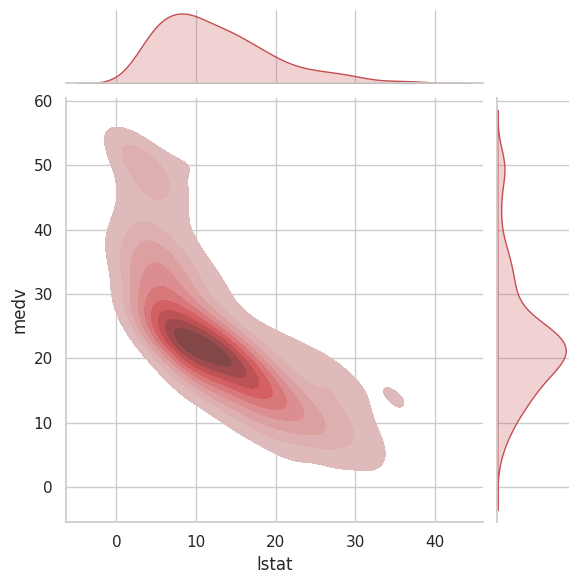

In [29]:
for col in data.select_dtypes("number"):
    if col !="medv":
       with sns.axes_style("white"):
           sns.set(style="whitegrid")  
           sns.set_palette("coolwarm")    
           sns.jointplot(x=data[col],y=data["medv"],kind="kde",fill=True,color="r")

array([[<Axes: title={'center': 'ID'}>, <Axes: title={'center': 'crim'}>,
        <Axes: title={'center': 'zn'}>,
        <Axes: title={'center': 'indus'}>],
       [<Axes: title={'center': 'chas'}>,
        <Axes: title={'center': 'nox'}>, <Axes: title={'center': 'rm'}>,
        <Axes: title={'center': 'age'}>],
       [<Axes: title={'center': 'dis'}>, <Axes: title={'center': 'rad'}>,
        <Axes: title={'center': 'tax'}>,
        <Axes: title={'center': 'ptratio'}>],
       [<Axes: title={'center': 'black'}>,
        <Axes: title={'center': 'lstat'}>,
        <Axes: title={'center': 'medv'}>, <Axes: >]], dtype=object)

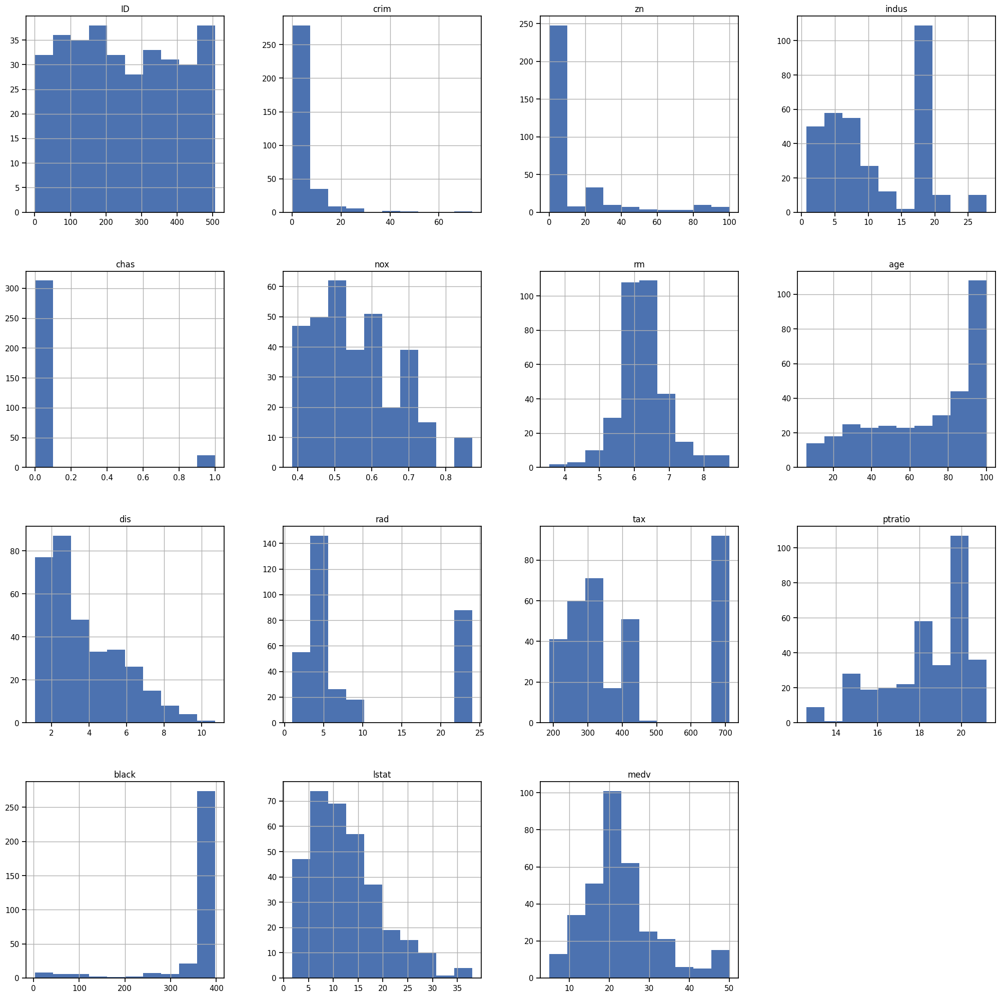

In [30]:
# plot the histgram:
data.hist(figsize=(25,25),color="b")

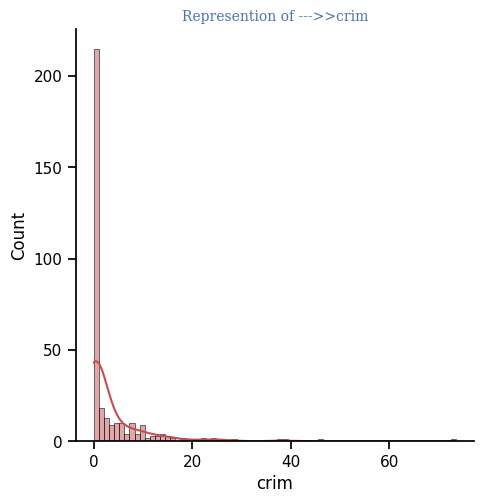

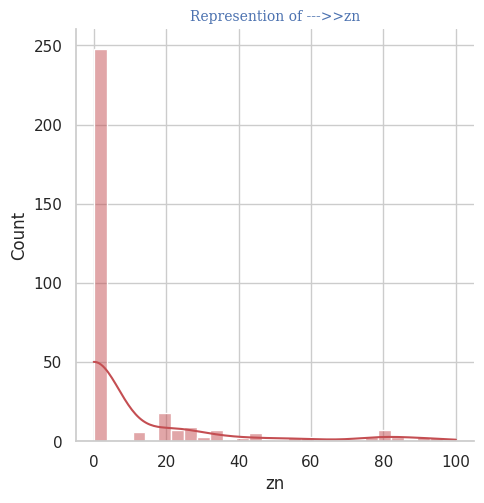

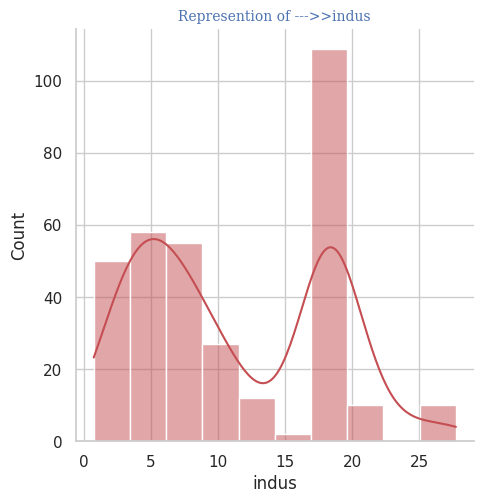

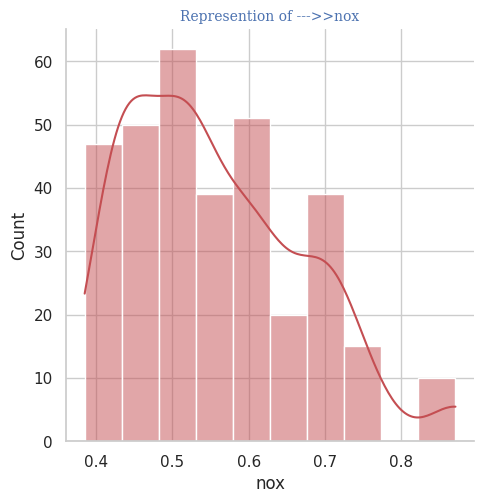

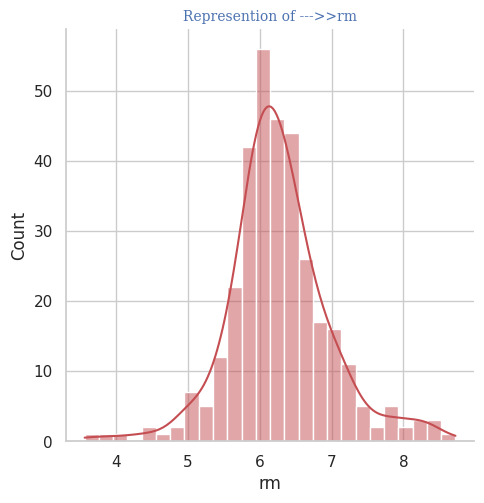

...

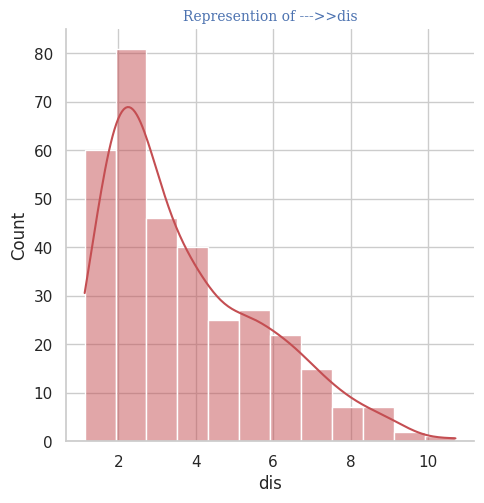

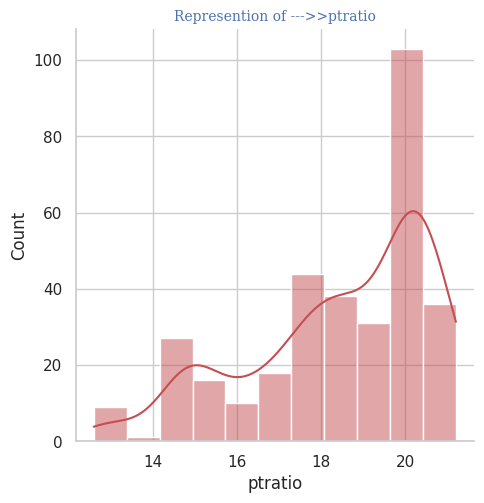

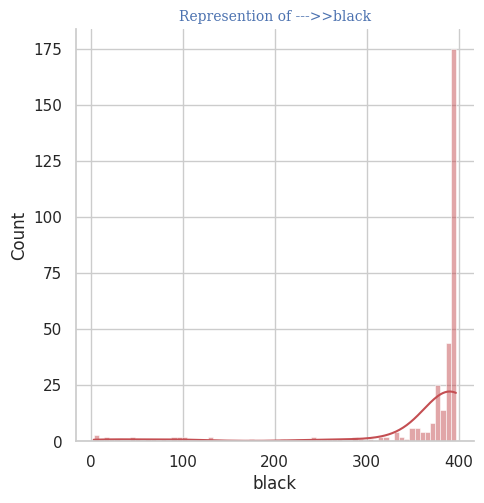

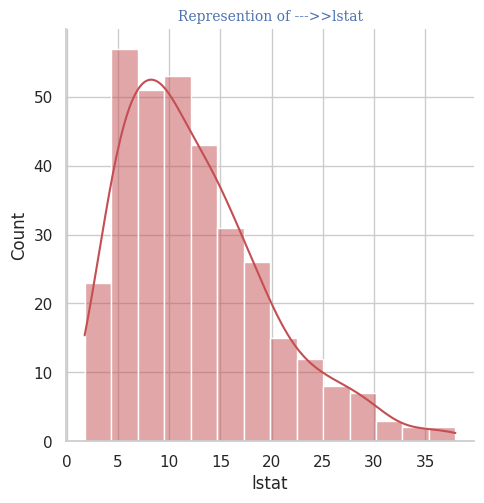

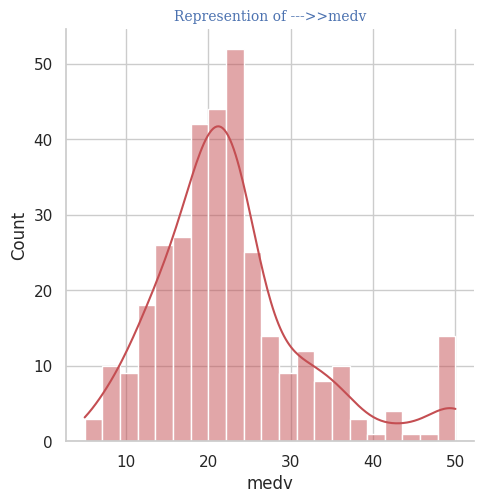

In [31]:
for col in data.select_dtypes(include="float64").columns:
    sns.displot(data[col],kde=True,color="r",label=col)
    sns.set(style="whitegrid")  # Set the plot style
    sns.set_palette("coolwarm")    # Set the color palette
    plt.title("Represention of --->>"+col,fontdict=f2)

<Figure size 15000x15000 with 0 Axes>

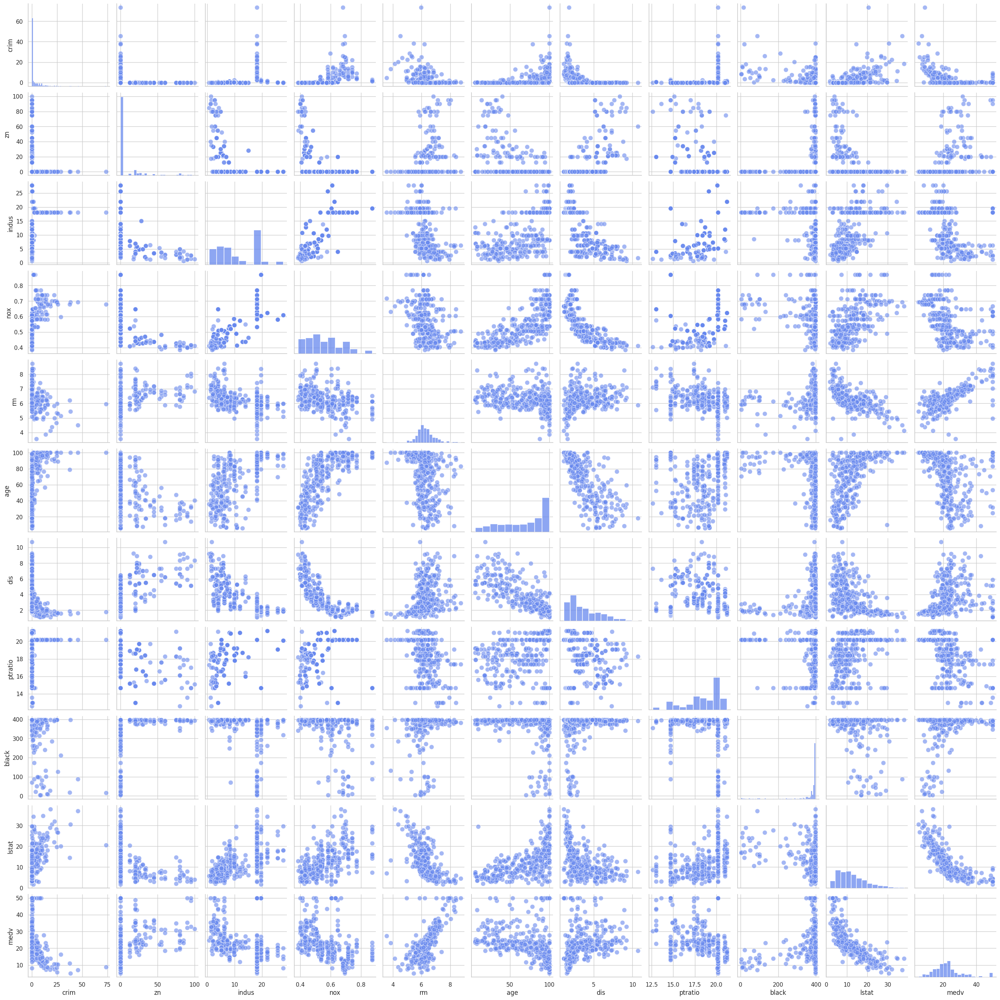

In [32]:
# observe for the float_data
plt.figure(figsize=(100, 100), dpi=150)
sns.set(style="whitegrid")  # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(data.select_dtypes(include='float64'), plot_kws={'alpha': 0.6, 's': 80})

## Split Data for Regression :


<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i split data into x_reg & y_cly_regass </p> 

<p> &bull; x_reg : refer into all Data Except Target (medv)</p> 

<p> &bull; y_reg : refer into Target (medv)</p> 

<p> &bull; then , iused train_test_split method to divide data into test , train</p> 
</div>


In [33]:
# split the data int train & test :
x_reg,y_reg=make_regression()
x_reg=df_cleaned.drop("medv",axis=1)
y_reg=df_cleaned["medv"]

In [34]:
# train split of the Data
x_train,x_test,y_train,y_test=train_test_split(x_reg,y_reg,test_size=0.3,random_state=42)
print("x_train shape : ",x_train.shape)
print("x_test shape : ",x_test.shape)
print("y_train shape : ",y_train.shape)
print("y_test shape : ",y_test.shape)

x_train shape :  (213, 14)
x_test shape :  (92, 14)
y_train shape :  (213,)
y_test shape :  (92,)


## Data Processing :







<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p>&bull; I used pipline method to make strong structure for processing for both scaler  Onehot  </p>
<p> &bull; i used OneHotEncoder  method from to convert any object/Categorical data into Numerical </p> 

<p> &bull; Also i used MinMaxScaler on this Data</p> 

<p> &bull; Here i didnt needed to Encoded the data as all the data are Numeric </p> 

In [35]:
# Define the numeric features and categorical features
categorical_features =x_train.select_dtypes("object").columns
numeric_features = x_train.select_dtypes("number").columns

# Print the features to ensure they are correctly identified
print("Categorical Features:", categorical_features)
print("Numeric Features:", numeric_features)

# Create preprocessing pipelines for  numeric 
preprocessor = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', MinMaxScaler())
])


 

Categorical Features: Index([], dtype='object')
Numeric Features: Index(['ID', 'crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis', 'rad',
       'tax', 'ptratio', 'black', 'lstat'],
      dtype='object')


## Bulding Regression models :

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


<p> &bull; linearRegression  </p> 

</div>



In [36]:
## Define the models :

LR=LinearRegression()
pipeline_linear_regression = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('linear_Regression', LR)
])


In [37]:
# train the model by using a pipline :
pipeline_linear_regression.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('imputer', SimpleImputer()),
                                 ('scaler', MinMaxScaler())])),
                ('linear_Regression', LinearRegression())])

Model: LinearRegression()
R2 Train Score: 0.7588124932428287
R2 Test Score: 0.769662885675306
--------------------------------------------------
Mean Squared Error of Train: 9.466830312779653
Mean Squared Error of Test: 9.556010611836872
--------------------------------------------------
Model accuracy: 0.769662885675306
Model_Mean_square_Error: 9.556010611836872


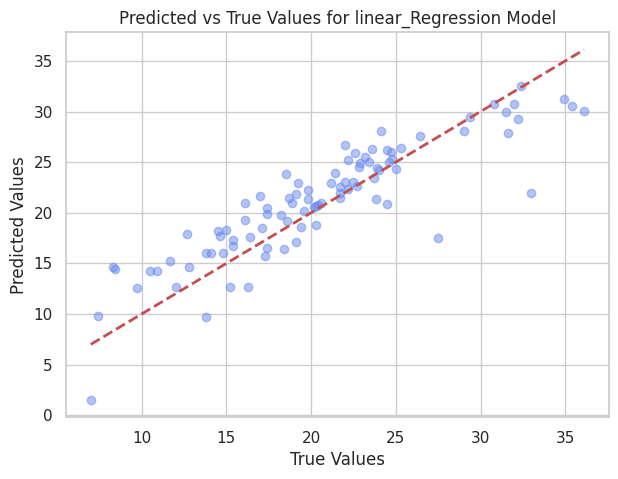

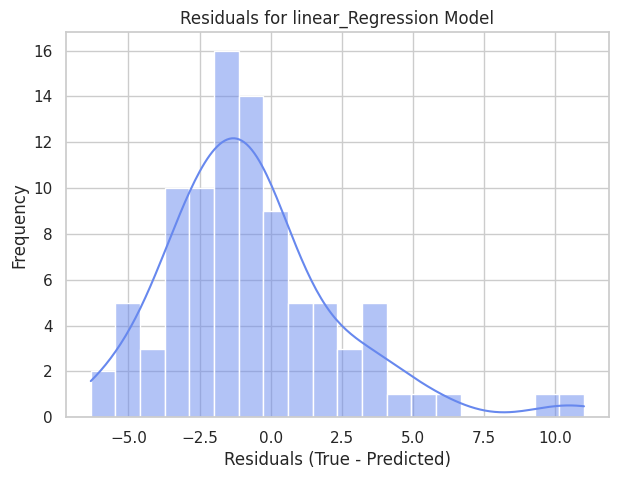

In [38]:
# Define a function to evaluate a regression pipeline

def evaluate_pipeline(pipeline, X_train, X_test, y_train, y_test, sc_y=None):
    y_pred = pipeline.predict(X_test)
    y_train_pred = pipeline.predict(X_train)
    
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    acc=pipeline.score(X_test,y_test)
    
    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_pred)
    mse_model=mean_squared_error(y_test,y_pred)
    
    if sc_y is not None:
        y_pred = sc_y.inverse_transform(y_pred.reshape(-1, 1))
        y_train_pred = sc_y.inverse_transform(y_train_pred.reshape(-1, 1))
        
        r2_test = r2_score(sc_y.inverse_transform(y_test.reshape(-1, 1)), y_pred)
        mse_test = mean_squared_error(sc_y.inverse_transform(y_test.reshape(-1, 1)), y_pred)
    
    print(f"Model: {pipeline.steps[-1][1]}")
    print("R2 Train Score:", r2_train)
    print("R2 Test Score:", r2_test)
    print("-"*50)
    print("Mean Squared Error of Train:", mse_train)
    print("Mean Squared Error of Test:", mse_test)
    print("-"*50)
    print("Model accuracy:",acc)
    print("Model_Mean_square_Error:",mse_model)
    
    # Plot the predicted vs true values
    plt.figure(figsize=(7, 5))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Predicted vs True Values for {pipeline.steps[-1][0]} Model')
    plt.show()
    
    # Plot the residuals
    plt.figure(figsize=(7, 5))
    sns.histplot((y_test - y_pred), bins=20, kde=True)
    plt.xlabel('Residuals (True - Predicted)')
    plt.ylabel('Frequency')
    plt.title(f'Residuals for {pipeline.steps[-1][0]} Model')
    plt.show()



evaluate_pipeline(pipeline_linear_regression, x_train, x_test, y_train, y_test)


In [39]:
from joblib import dump, load

dump(pipeline_linear_regression,'model.joblib')

model = load('model.joblib')
print("model is saved .............")

model is saved .............


## Conclusion :














<div style="border: 5px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


    
<p>&bull; in the Conclusion i want to thank all team of Neuro & Eng\Taher .</p>
<p>&bull; thanks for all Neuro Team .</p>

<img src="Neuro.jpg" alt="My Image">

<p>&bull; Your support is greatly appreciated! .</p>


<p>&bull; Kaggle: Your Home for Data Science</p>


<p>&bull; <a href="https://www.kaggle.com/abdalrhamnhebishy" target="_blank">Kaggle profile</a>.</p>


<p>&bull;  AbdalRhman Hebishy , DataScientist||Machine learning||Deeplearning Engineer .</p>
   

</div>

<img src="https://morethankyounotes.com/wp-content/uploads/2016/08/Thank-you-for-house-sitting.png" alt="My Image">